<a href="https://colab.research.google.com/github/ErnestWang31/Autonomous-Car-ML/blob/main/AutonomousVehicleBehaviouralCloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ErnestWang31/Track

Cloning into 'Track'...
remote: Enumerating objects: 38928, done.
remote: Total 38928 (delta 0), reused 0 (delta 0), pack-reused 38928
Receiving objects: 100% (38928/38928), 536.04 MiB | 18.96 MiB/s, done.
Resolving deltas: 100% (5/5), done.
Updating files: 100% (18547/18547), done.


In [ ]:
!ls Track

driving_log.csv  IMG


In [ ]:
!pip3 install imgaug

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import random
import ntpath

In [ ]:
datadir = 'Track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-5-d963de388c8a>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\center_2020_04_29_12_34_34_667.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\left_2020_04_29_12_34_34_667.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\right_2020_04_29_12_34_34_667.jpg,0.0,0.0,0.0,0.000078
1,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\center_2020_04_29_12_34_34_769.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\left_2020_04_29_12_34_34_769.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\right_2020_04_29_12_34_34_769.jpg,0.0,0.0,0.0,0.000081
2,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\center_2020_04_29_12_34_34_870.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\left_2020_04_29_12_34_34_870.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\right_2020_04_29_12_34_34_870.jpg,0.0,0.0,0.0,0.000078
3,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\center_2020_04_29_12_34_34_976.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\left_2020_04_29_12_34_34_976.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\right_2020_04_29_12_34_34_976.jpg,0.0,0.0,0.0,0.000078
4,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\center_2020_04_29_12_34_35_079.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\left_2020_04_29_12_34_35_079.jpg,D:\XIAOMI ALEX\Online Courses\Self Driving Course\9. Behavioral Cloning\Data\IMG\right_2020_04_29_12_34_35_079.jpg,0.0,0.0,0.0,0.000079


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2020_04_29_12_34_34_667.jpg,left_2020_04_29_12_34_34_667.jpg,right_2020_04_29_12_34_34_667.jpg,0.0,0.0,0.0,0.000078
1,center_2020_04_29_12_34_34_769.jpg,left_2020_04_29_12_34_34_769.jpg,right_2020_04_29_12_34_34_769.jpg,0.0,0.0,0.0,0.000081
2,center_2020_04_29_12_34_34_870.jpg,left_2020_04_29_12_34_34_870.jpg,right_2020_04_29_12_34_34_870.jpg,0.0,0.0,0.0,0.000078
3,center_2020_04_29_12_34_34_976.jpg,left_2020_04_29_12_34_34_976.jpg,right_2020_04_29_12_34_34_976.jpg,0.0,0.0,0.0,0.000078
4,center_2020_04_29_12_34_35_079.jpg,left_2020_04_29_12_34_35_079.jpg,right_2020_04_29_12_34_35_079.jpg,0.0,0.0,0.0,0.000079


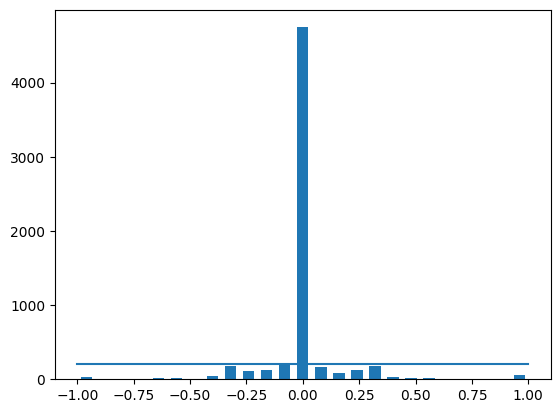

In [ ]:
num_bins = 25
samples_per_bin = 200
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width = 0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 6182
removed: 4562
remaining: 1620


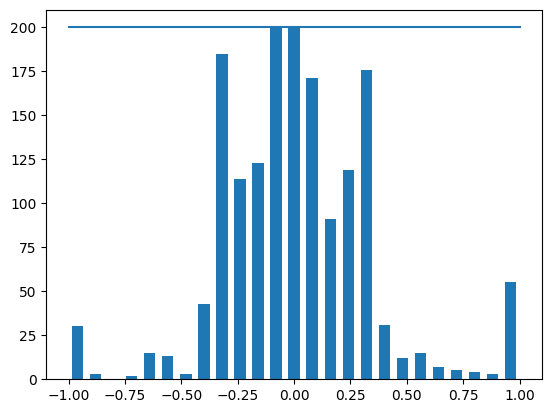

In [ ]:
print('total data:', len(data))

remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))

plt.bar(center, hist, width = 0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2020_04_29_12_34_39_937.jpg
left        left_2020_04_29_12_34_39_937.jpg  
right       right_2020_04_29_12_34_39_937.jpg 
steering    0.0                               
throttle    0.0                               
reverse     0.0                               
speed       0.000079                          
Name: 51, dtype: object


In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 1296
Valid Samples: 324


Text(0.5, 1.0, 'Validation set')

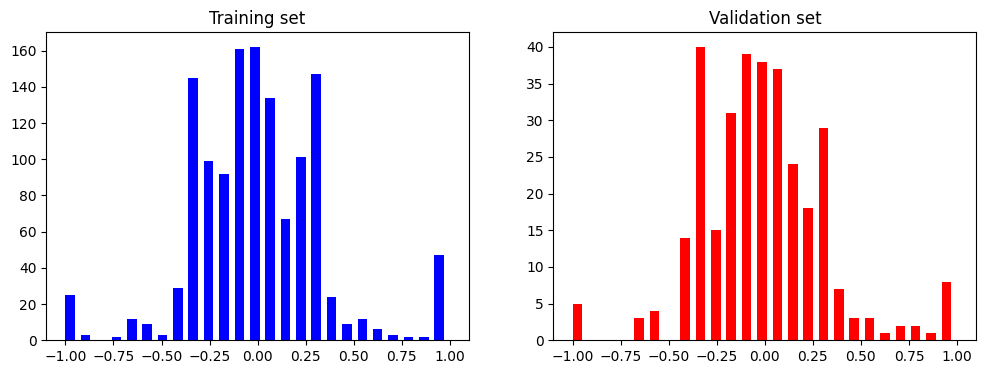

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale = (1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed')

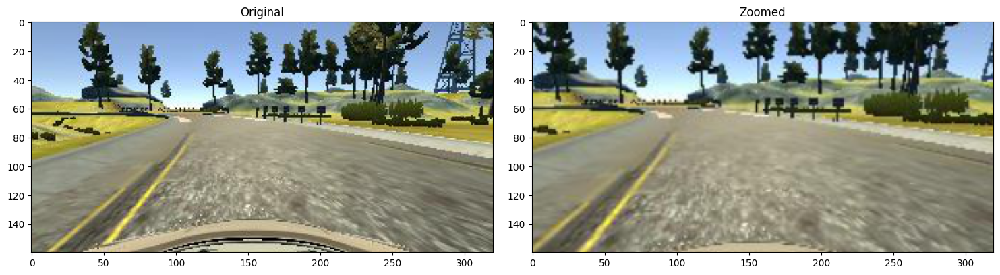

In [ ]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed')



In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent = {'x' : (-0.1, 0.1), 'y': (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'panned')

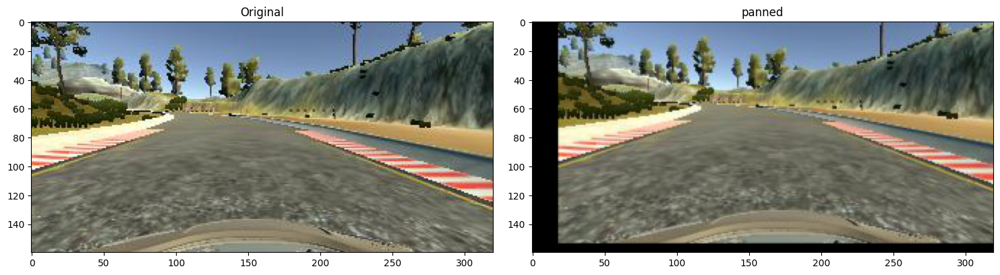

In [ ]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(panned_image)
axs[1].set_title('panned')


In [ ]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'brightness altered')

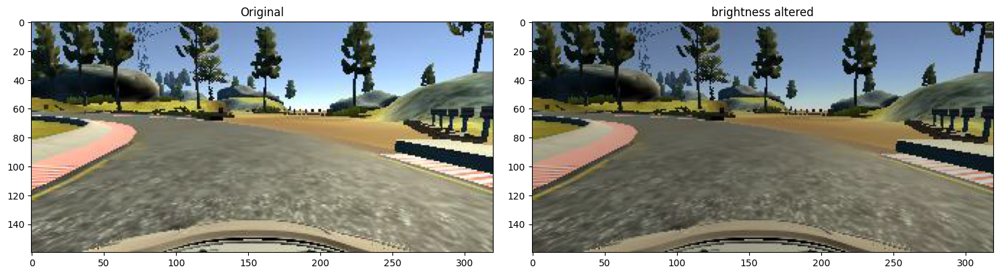

In [ ]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('brightness altered')

In [ ]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'flipped altered')

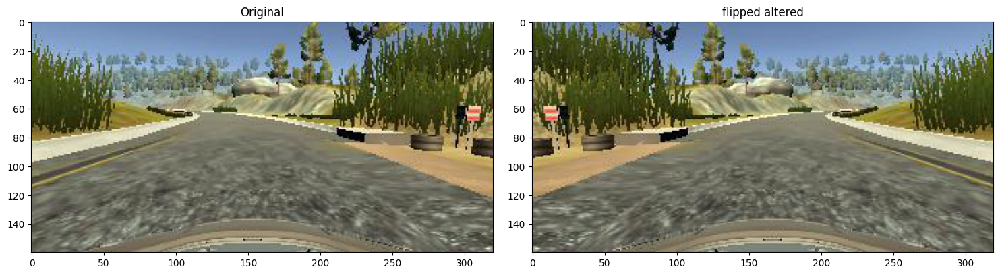

In [ ]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original')

axs[1].imshow(flipped_image)
axs[1].set_title('flipped altered')

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

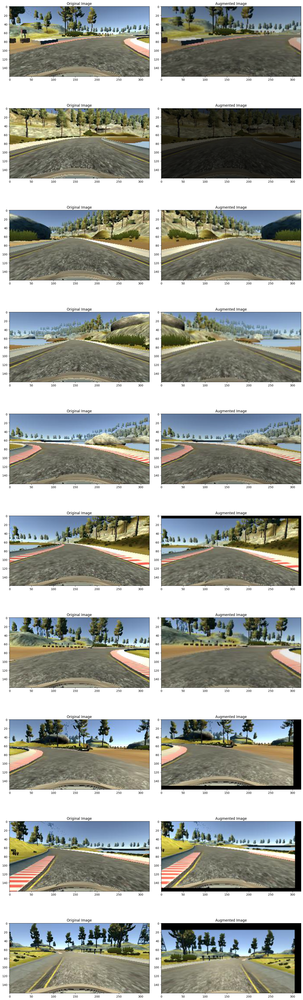

In [ ]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

Text(0.5, 1.0, 'Preprocessed Image')

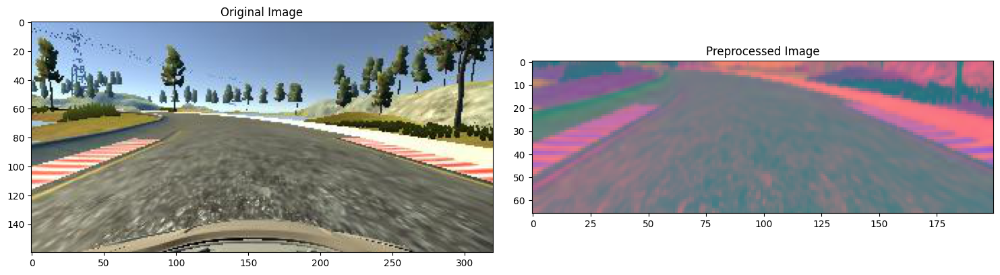

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

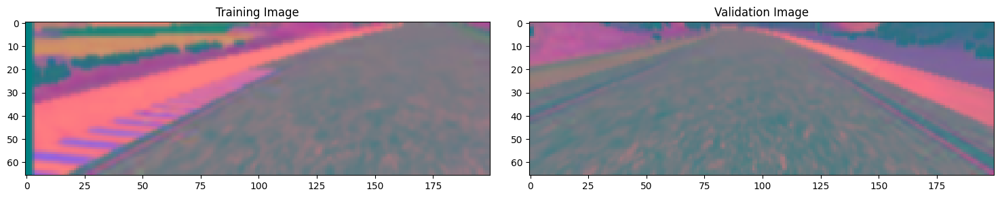

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
# X_train = np.array(list(map(img_preprocess, X_train)))
# X_valid = np.array(list(map(img_preprocess, X_valid)))

TypeError: ignored

In [ ]:
# plt.imshow(X_train[random.randint(0,len(X_train) - 1)])
# plt.axis('off')
# print(X_train.shape)

In [ ]:
def nvidia_model():

  model = Sequential()

  model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))

  model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Dropout(0.5))


  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  model.add(Dropout(0.5))


  model.add(Dense(50, activation='elu'))
  model.add(Dense(10, activation ='elu'))
  model.add(Dense(1))


  optimizer= Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)

  return model

In [ ]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 dropout (Dropout)           (None, 1, 18, 64)         0         
                                                                 
 flatten (Flatten)           (None, 1152)              0

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-49-1380e7fdc075>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 440s 1s/step - loss: 0.1318 - val_loss: 0.0844
Epoch 2/10
300/300 [==============================] - 490s 2s/step - loss: 0.0968 - val_loss: 0.0785
Epoch 3/10
300/300 [==============================] - 431s 1s/step - loss: 0.0891 - val_loss: 0.0527
Epoch 4/10
300/300 [==============================] - 434s 1s/step - loss: 0.0827 - val_loss: 0.0526
Epoch 5/10
300/300 [==============================] - 489s 2s/step - loss: 0.0815 - val_loss: 0.0418
Epoch 6/10
300/300 [==============================] - 476s 2s/step - loss: 0.0773 - val_loss: 0.0505
Epoch 7/10
300/300 [==============================] - 478s 2s/step - loss: 0.0719 - val_loss: 0.0356
Epoch 8/10
300/300 [==============================] - 419s 1s/step - loss: 0.0732 - val_loss: 0.0381
Epoch 9/10
300/300 [==============================] - 479s 2s/step - loss: 0.0707 - val_loss: 0.0393
Epoch 10/10
300/300 [==============================] - 419s 1s/step - loss: 0.0650 - val_lo

Text(0.5, 0, 'Epoch')

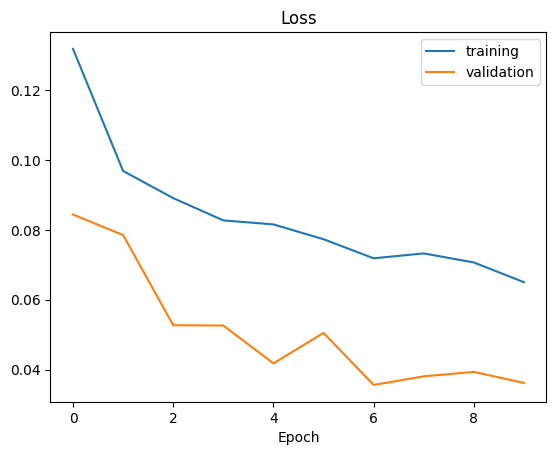

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')

In [ ]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>